In [1]:
import os, sys
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from importlib import reload
from tqdm import tqdm
from scipy.ndimage import gaussian_filter1d
from skimage.morphology import binary_opening, binary_closing
from scipy.ndimage.filters import gaussian_filter
import pickle
from skimage.feature import peak_local_max
from copy import deepcopy

In [2]:
NOTEBOOK_DIR = os.getcwd()
MODULE_DIR, _ = os.path.split(NOTEBOOK_DIR)
OUT_DIR = os.path.join(MODULE_DIR, "outputs")
sys.path.append(MODULE_DIR)

In [3]:
from longterm import load, utils
from longterm.utils import list_attr, list_fn, list_mthd, list_join
from longterm import plot as myplt
from longterm import rois
from longterm import analysis as an

In [4]:
fly_dir = os.path.join(load.NAS2_DIR_LH, "210527", "fly4")
fly_processed_dir = os.path.join(fly_dir, load.PROCESSED_FOLDER)
pkl_dir = os.path.join(fly_processed_dir, "compare_trials.pkl")
with open(pkl_dir, "rb") as f:
    summary_dict = pickle.load(f)
mask_dir = os.path.join(fly_processed_dir, "dff_mask_denoised_t1.tif")
mask = utils.get_stack(mask_dir) == 0

trial_dirs = utils.readlines_tolist(os.path.join(fly_dir, "trial_dirs.txt"))
i_trials = [3,4,6,10]
selected_trial_dirs = [trial_dirs[i] for i in i_trials]
processed_dirs = list_join(selected_trial_dirs, load.PROCESSED_FOLDER)
green_denoised_dirs = list_join(processed_dirs, "green_denoised_t1.tif")


roi_file = os.path.join(fly_processed_dir, "ROI_centers.txt")
roi_centers = rois.read_roi_center_file(roi_file)

Read the centers of 78 ROIs from file


In [5]:
local_corrs = summary_dict["green_local_corrs"]
local_corr_all = np.mean(local_corrs, axis=0)
local_corr_all[mask] = 0
stds = summary_dict["green_stds"]
std_all = np.mean(stds, axis=0)
std_all[mask] = 0
maxs = summary_dict["green_quants"]
max_all = np.max(maxs, axis=0)
max_all[mask] = 0

In [6]:
local_peak_std = peak_local_max(std_all, min_distance=5, threshold_abs=0.001)
local_peak_max = peak_local_max(max_all, min_distance=5, threshold_abs=0.001)
local_peak_corr = peak_local_max(local_corr_all, min_distance=5, threshold_abs=0.001)

<IPython.core.display.Javascript object>


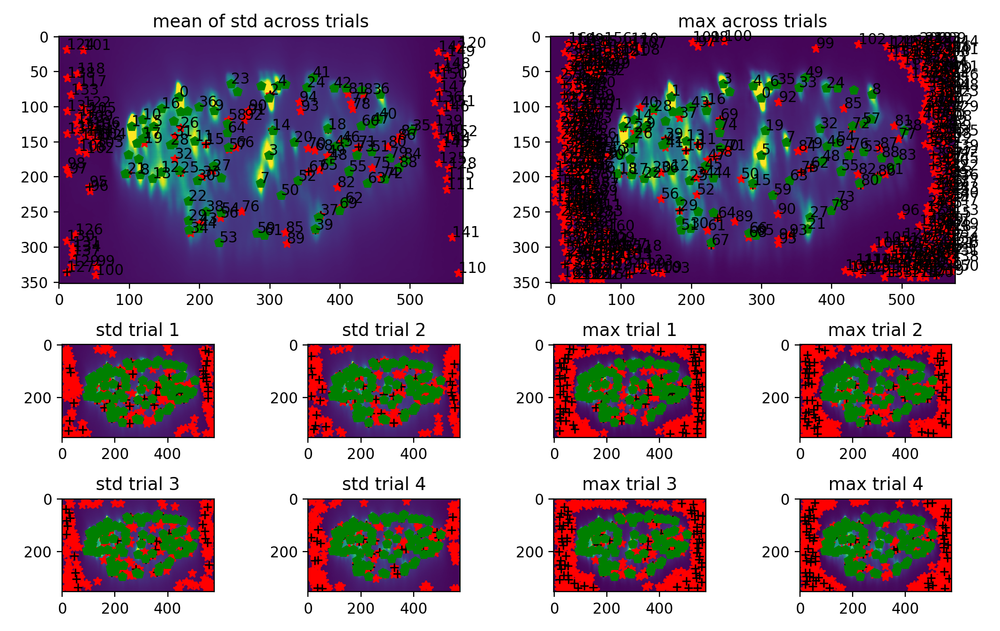

In [7]:
%matplotlib notebook
quantile = 0.99
SHOW_MAX = True
CONFIRMED = True

fig = plt.figure(figsize=(9.5, 6))  # contstained_layout=True)
layout = """
    AABB
    AABB
    CDEF
    GHIJ
    """
axs_names = "ABCDEFGHIJ"
ax_dict = fig.subplot_mosaic(layout)  # , sharex=True, sharey=True)

for i_ax, ax_name in enumerate(axs_names):
    if i_ax:
        # ax_dict[ax_name].set_xticklabels([])
        # ax_dict[ax_name].set_yticklabels([])
        ax_dict[axs_names[0]].get_shared_x_axes().join(ax_dict[axs_names[0]], ax_dict[ax_name])
        ax_dict[axs_names[0]].get_shared_y_axes().join(ax_dict[axs_names[0]], ax_dict[ax_name])
   

for i_ax, ax_name in enumerate(axs_names):
    ax = ax_dict[axs_names[i_ax]]
    if i_ax == 0:
        im = std_all
        title = "mean of std across trials"
    elif i_ax == 1:
        im = max_all
        title = "max across trials"
    else:
        i_row = (i_ax - 2) // 4
        i_col = (i_ax - 2) % 4
        if i_col < 2:  # target all the left small subplots
            i_trial = i_row * 2 + i_col
            im = stds[i_trial]
            title = "std trial {}".format(i_trial + 1)
        else:
            i_trial = i_row * 2 + i_col - 2
            im = maxs[i_trial]
            title = "max trial {}".format(i_trial + 1)
    ax.imshow(im, clim=[0, np.quantile(im, quantile)])
    ax.set_title(title)
    
    if SHOW_MAX:
        if i_ax == 0:
            coordinates5 = local_peak_std
        elif i_ax == 1:
            coordinates5 = local_peak_max
        else:
            coordinates5 = peak_local_max(im, min_distance=5, threshold_abs=0.001)
        coordinates10 = peak_local_max(im, min_distance=10, threshold_abs=0.001)
        _ = [ax.plot(pixel[1], pixel[0], 'r*') for pixel in coordinates5]
        _ = [ax.plot(pixel[1], pixel[0], 'k+') for pixel in coordinates10]
        if i_ax <= 1:
            for i in range(len(coordinates5)):
                ax.annotate(str(i), np.flip(coordinates5[i]))
    if CONFIRMED:
        _ = [ax.plot(pixel[1], pixel[0], 'gp') for pixel in roi_centers]
        
      
fig.tight_layout()

<IPython.core.display.Javascript object>


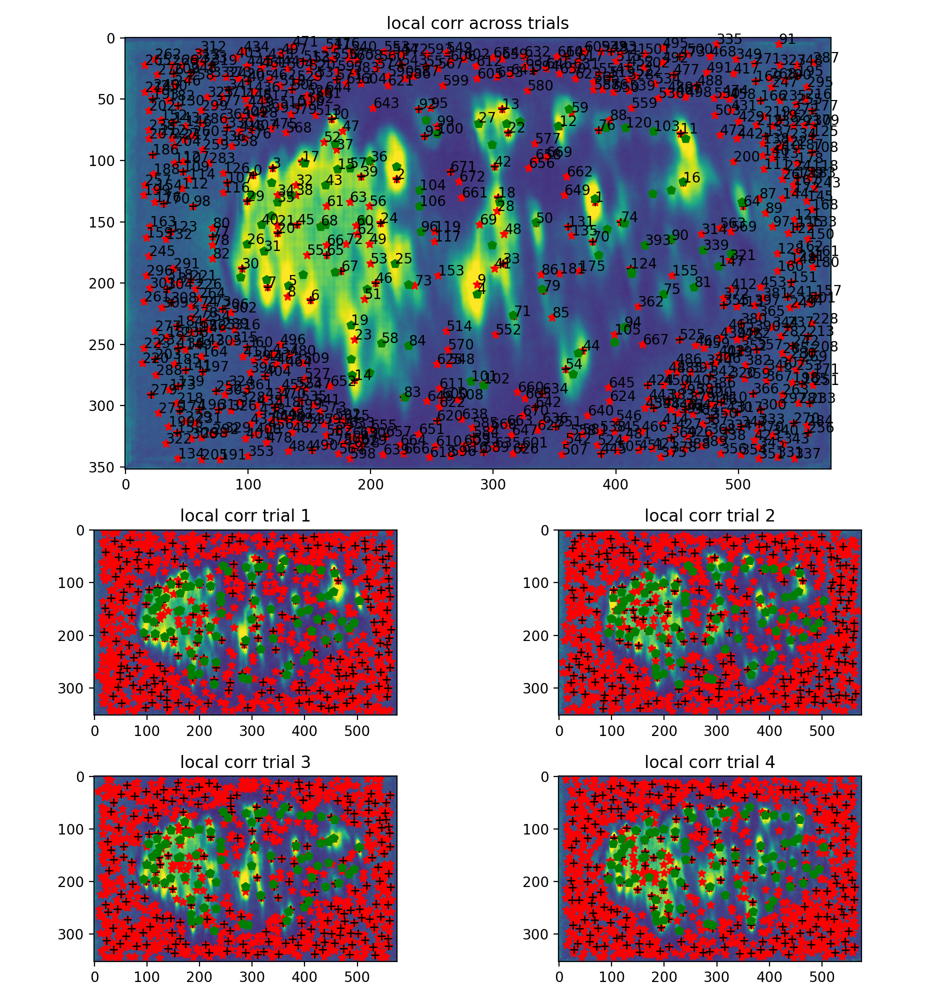

In [8]:
%matplotlib notebook
quantile = 0.99
SHOW_MAX = True
CONFIRMED = True

fig = plt.figure(figsize=(9.5, 10))  # contstained_layout=True)
layout = """
    AA
    AA
    BC
    DE
    """
axs_names = "ABCDE"
ax_dict = fig.subplot_mosaic(layout)  # , sharex=True, sharey=True)

for i_ax, ax_name in enumerate(axs_names):
    if i_ax:
        # ax_dict[ax_name].set_xticklabels([])
        # ax_dict[ax_name].set_yticklabels([])
        ax_dict[axs_names[0]].get_shared_x_axes().join(ax_dict[axs_names[0]], ax_dict[ax_name])
        ax_dict[axs_names[0]].get_shared_y_axes().join(ax_dict[axs_names[0]], ax_dict[ax_name])
   

for i_ax, ax_name in enumerate(axs_names):
    ax = ax_dict[axs_names[i_ax]]
    if i_ax == 0:
        im = local_corr_all
        title = "local corr across trials"
    else:
        i_row = (i_ax - 1) // 2
        i_col = (i_ax - 1) % 2
        i_trial = i_row * 2 + i_col
        im = local_corrs[i_trial]
        title = "local corr trial {}".format(i_trial + 1)

    ax.imshow(im, clim=[0, np.quantile(im, quantile)])
    ax.set_title(title)
    
    if SHOW_MAX:
        if i_ax == 0:
            coordinates5 = local_peak_corr
        else:
            coordinates5 = peak_local_max(im, min_distance=5, threshold_abs=0.001)
        coordinates10 = peak_local_max(im, min_distance=10, threshold_abs=0.001)
        _ = [ax.plot(pixel[1], pixel[0], 'r*') for pixel in coordinates5]
        _ = [ax.plot(pixel[1], pixel[0], 'k+') for pixel in coordinates10]
        if i_ax == 0 :
            for i in range(len(coordinates5)):
                ax.annotate(str(i), np.flip(coordinates5[i]))
    if CONFIRMED:
        _ = [ax.plot(pixel[1], pixel[0], 'gp') for pixel in roi_centers]
        
      
fig.tight_layout()

In [9]:
greens = list_fn(green_denoised_dirs, utils.get_stack)

In [12]:
mask_repeat = np.tile(np.expand_dims(mask, axis=0), (greens[0].shape[0], 1, 1))

In [24]:
N_trials = len(greens)

all_collected_peaks = []
all_local_max = []

for i_trial in tqdm(range(N_trials)):
    green = deepcopy(greens[i_trial])
    np.putmask(green, mask_repeat, 0)
    np.putmask(green, green<0, 0)
    green_denoised = gaussian_filter(green, sigma=(3,3,3))
    collected_peaks = np.zeros_like(greens[i_trial][0])
    local_max_list = []
    
    for g in green_denoised:
        local_max = peak_local_max(g, min_distance=5, threshold_abs=0.001)
        local_max_list.append(local_max)
        collected_peaks[[p[0] for p in local_max], [p[1] for p in local_max]] += 1
    all_collected_peaks.append(collected_peaks)
    all_local_max.append(local_max_list)

100%|██████████| 4/4 [05:42<00:00, 85.59s/it]


In [25]:
N_frames = len(greens[0])

<IPython.core.display.Javascript object>


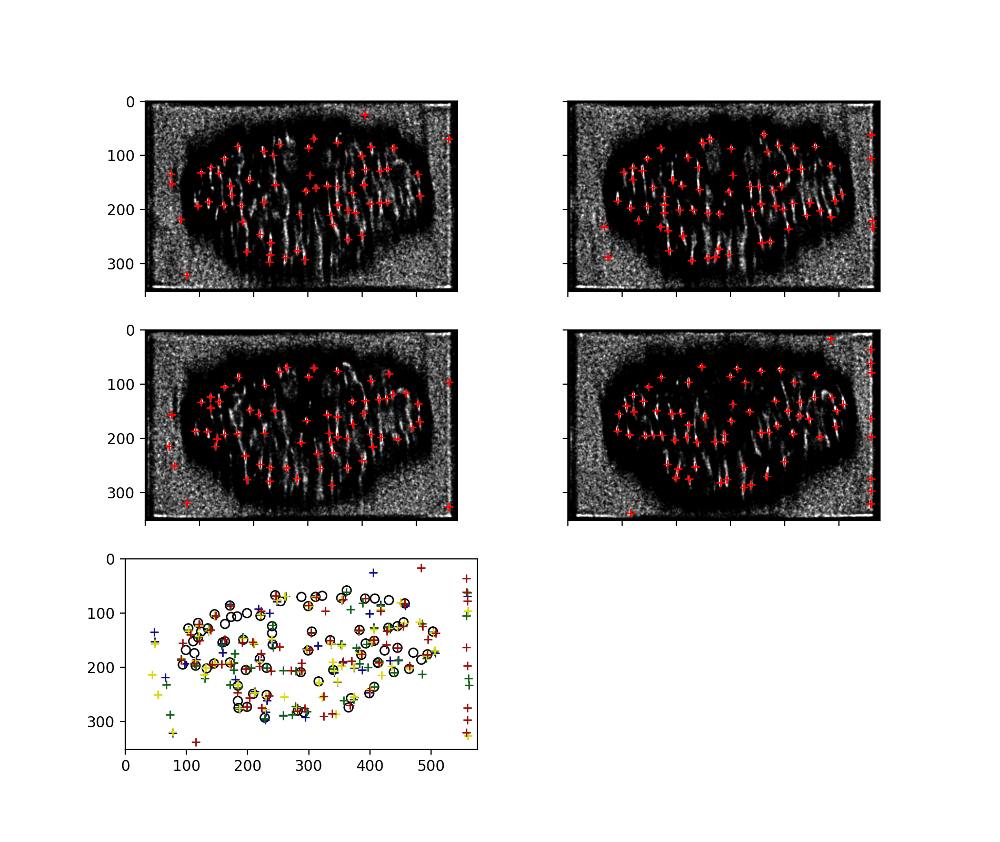

In [27]:
%matplotlib notebook
colors = [myplt.DARKBLUE,  myplt.DARKGREEN, 
          myplt.DARKYELLOW, myplt.DARKRED]

fig, axs = plt.subplots(3,2, figsize=(9.5, 8), sharex=True, sharey=True)

for i_ax, ax in enumerate(axs.flatten()):
    if i_ax < N_trials:
        im_smooth = gaussian_filter(all_collected_peaks[i_ax]/N_frames, sigma=(1,1))
        ax.imshow(im_smooth, cmap=plt.cm.get_cmap("Greys_r"), clim=[0, 0.01] )
        coordinates5 = peak_local_max(im_smooth, min_distance=10, threshold_abs=0.01)
        _ = [ax.plot(pixel[1], pixel[0], 'r+') for pixel in coordinates5]
        _ = [axs.flatten()[-2].plot(pixel[1], pixel[0], '+', color=colors[i_ax]) for pixel in coordinates5]
        

        # _ = [ax.plot(pixel[1], pixel[0], 'r*') for pixel in roi_centers]
    elif i_ax == N_trials: 
        _ = [ax.scatter(pixel[1], pixel[0], facecolors='none', edgecolors='k') for pixel in roi_centers]
    else:
        ax.axis("off")

## compute peaks in local maximum image

In [28]:
coords_trials = []

for i_trial in range(len(selected_trial_dirs)):
    im_smooth = gaussian_filter(all_collected_peaks[i_trial]/N_frames, sigma=(1,1))
    coordinates10 = peak_local_max(im_smooth, min_distance=10, threshold_abs=0.01)
    coords_trials.append(coordinates10)

In [94]:
thres_dist = 10

current_coords = coords_trials[0]
coords_sorted = np.ones((len(current_coords), len(selected_trial_dirs), 2))
coords_sorted[:,0,:] = coords_trials[0]
coord_inds = -1 * np.ones((len(current_coords), len(selected_trial_dirs))).astype(np.int16)
coord_inds[:,0] = np.arange(len(current_coords))
distances = -1 * np.ones((len(current_coords), len(selected_trial_dirs))).astype(np.int16)

for i_trial in range(1,len(selected_trial_dirs)):
    for i_coord, coord in enumerate(current_coords):
        dists = np.sqrt(np.sum(np.square(coords_trials[i_trial] - coord), axis=1))
        min_ind = np.argmin(dists)
        distances[i_coord, i_trial] = dists[min_ind]
        if dists[min_ind] < thres_dist and coord[1] < 510 and coord[1] > 80:
            current_coords[i_coord] = coords_trials[i_trial][min_ind]
            coord_inds[i_coord, i_trial] = min_ind
            coords_sorted[i_coord, i_trial] = coords_trials[i_trial][min_ind]
        else:
            coords_sorted[i_coord, i_trial] = coords_sorted[i_coord, i_trial-1]



In [95]:
np.sum(np.sum(coord_inds >= 0, axis=1) >= N_trials)

21

In [96]:
selected_coord_inds = coord_inds[np.sum(coord_inds >= 0, axis=1) >= N_trials-1, :]
selected_coords = coords_sorted[np.sum(coord_inds >= 0, axis=1) >= N_trials-1, :, :]

<IPython.core.display.Javascript object>


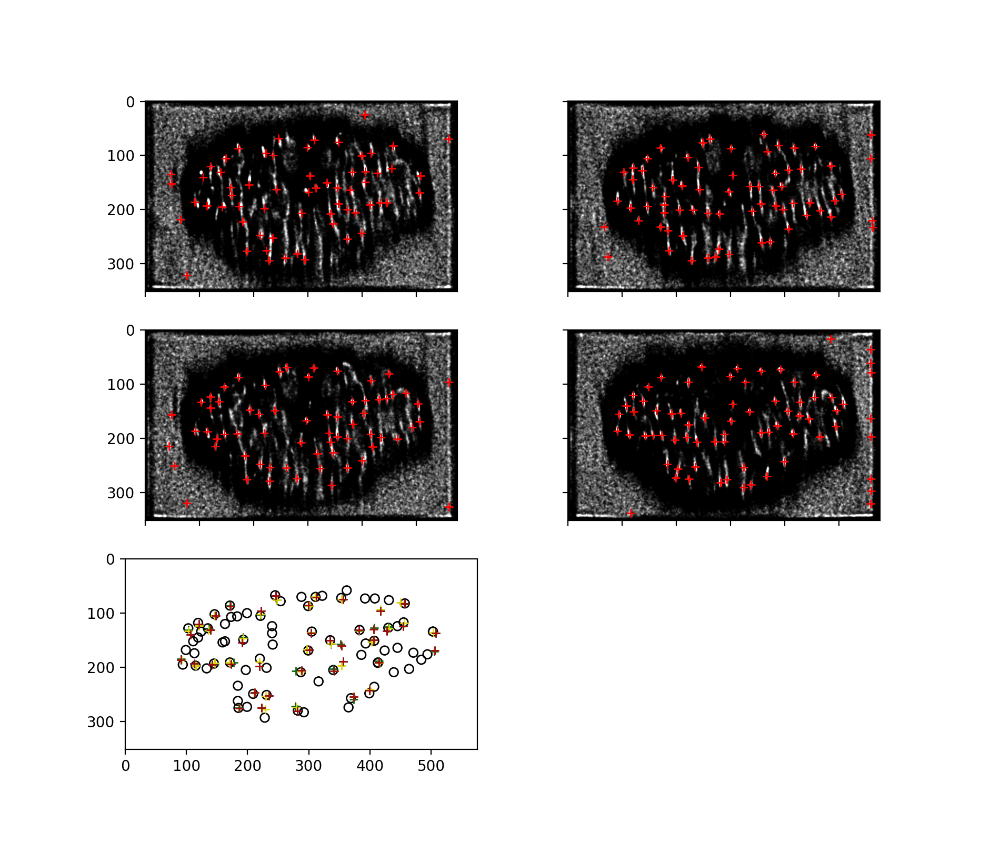

In [97]:
%matplotlib notebook
colors = [myplt.DARKBLUE,  myplt.DARKGREEN, 
          myplt.DARKYELLOW, myplt.DARKRED]


fig, axs = plt.subplots(3,2, figsize=(9.5, 8), sharex=True, sharey=True)

for i_ax, ax in enumerate(axs.flatten()):
    if i_ax < N_trials:
        im_smooth = gaussian_filter(all_collected_peaks[i_ax]/N_frames, sigma=(1,1))
        ax.imshow(im_smooth, cmap=plt.cm.get_cmap("Greys_r"), clim=[0, 0.01])
        
        _ = [ax.plot(pixel[1], pixel[0], 'r+') for pixel in coords_trials[i_ax]]
        _ = [axs.flatten()[-2].plot(pixel[1], pixel[0], '+', color=colors[i_ax])
             for i_p, pixel in enumerate(selected_coords[:,i_ax,:])]
        # if i_ax == 0:
        #     for i in range(len(selected_coords)):
        #             axs.flatten()[-1].annotate(str(i), np.flip(selected_coords[i,i_ax,:]), color=colors[i_ax])
        

        # _ = [ax.plot(pixel[1], pixel[0], 'r*') for pixel in roi_centers]
    elif i_ax == N_trials: 
        _ = [ax.scatter(pixel[1], pixel[0], facecolors='none', edgecolors='k') for pixel in roi_centers]
        # for i in range(len(roi_centers)):
        #         ax.annotate(str(i), np.flip(roi_centers[i]))
    else:
        ax.axis("off")

## matching between manual ROIs and corrected ROIs

In [98]:
matching_selected_manual = -1 * np.ones(len(selected_coords)).astype(np.int16)
distances_selected_manual = -1 * np.ones(len(selected_coords))
thres_dist = 5

for i_coord, coord in enumerate(np.mean(selected_coords, axis=1)):
    dists = np.sqrt(np.sum(np.square(roi_centers - coord), axis=1))
    min_ind = np.argmin(dists)
    distances_selected_manual[i_coord] = dists[min_ind]
    if dists[min_ind] < thres_dist:
        matching_selected_manual[i_coord] = min_ind

In [99]:
print(matching_selected_manual)
print(distances_selected_manual)

[-1 30 16 38 10 33 25  6 37 23  3  0 47  4 11 39 -1 -1  2 -1 17 -1 51 -1
 53 69 -1 68 27 -1 -1 36 -1 67 48 -1 50 -1 -1 31]
[ 8.24621125  1.60078106  1.5         3.28823661  1.06066017  3.90512484
  1.41421356  1.41421356  1.25        2.23606798  3.71651719  1.06066017
  4.3660623   3.16227766  4.65026881  2.01556444  5.77169819 21.76292719
  3.64005494  5.52268051  2.70416346  9.89002022  1.90394328 13.428049
  2.70416346  3.60555128 17.60149141  3.02076149  2.85043856 20.88659857
 12.04159458  2.01556444  5.50567889  3.2596012   2.30488611  5.38516481
  1.80277564 20.68362879 23.80257339  2.6925824 ]


In [100]:
fly_roi_centers_corrected_file = os.path.join(fly_processed_dir, "ROI_centers_corrected.pkl")
outdata = {"trials": trial_dirs,
           "selected_centers": selected_coords.astype(np.int16),
           "max_projections": all_collected_peaks,
           "matching_rois": matching_selected_manual,
           "matching_distances": distances_selected_manual}
with open(fly_roi_centers_corrected_file, "wb") as f:
    pickle.dump(outdata, f)
for i_trial, processed_dir in enumerate(processed_dirs):
    trial_roi_centers_corrected_file = os.path.join(processed_dir, "ROI_centers_corrected.txt")
    rois.write_roi_center_file(np.squeeze(selected_coords[:,i_trial, :]).astype(np.int16), trial_roi_centers_corrected_file)
    
fly_roi_centers_corrected_mean_file = os.path.join(fly_processed_dir, "ROI_centers_corrected_mean.txt")
rois.write_roi_center_file(np.mean(selected_coords, axis=1).astype(np.int16), fly_roi_centers_corrected_mean_file)

utils.save_stack(os.path.join(fly_processed_dir, "max_projections.tif"), np.array(all_collected_peaks))

## check the ROI signals

In [101]:
neural_dfs = []
neural_dfs_corrected = []
neural_dfs_corrected_mean = []
for i_trial, trial_dir in enumerate(selected_trial_dirs):
    neural_df_dir = os.path.join(trial_dir, "processed", "twop_df.pkl")
    neural_df_dir_corrected = os.path.join(trial_dir, "processed", "twop_df_corrected.pkl")
    neural_df_dir_corrected_mean = os.path.join(trial_dir, "processed", "twop_df_corrected_mean.pkl")
    neural_dfs.append(pd.read_pickle(neural_df_dir))
    neural_dfs_corrected.append(pd.read_pickle(neural_df_dir_corrected))
    neural_dfs_corrected_mean.append(pd.read_pickle(neural_df_dir_corrected_mean))

In [102]:
matching_selected_manual

array([-1, 30, 16, 38, 10, 33, 25,  6, 37, 23,  3,  0, 47,  4, 11, 39, -1,
       -1,  2, -1, 17, -1, 51, -1, 53, 69, -1, 68, 27, -1, -1, 36, -1, 67,
       48, -1, 50, -1, -1, 31], dtype=int16)

In [103]:
neural_dfs_matched = deepcopy(neural_dfs_corrected)
for i_trial in range(len(neural_dfs_matched)):
    for i_neuron, i_match in enumerate(matching_selected_manual):
        if i_match != -1:
            neural_dfs_matched[i_trial]["neuron_{}".format(i_neuron)] = neural_dfs[i_trial]["neuron_{}".format(i_match)]
        else:
            neural_dfs_matched[i_trial]["neuron_{}".format(i_neuron)] = np.zeros(len(neural_dfs[i_trial]))
    

In [104]:
neural_dfs_matched[0]

t  neuron_0    neuron_1  \
Date   Genotype Fly TrialName Trial Frame                                     
210527 J1xM5    4   cs_003    3     0        1.848067       0.0  297.333922   
                                    1        1.909667       0.0  240.052652   
                                    2        1.971267       0.0  206.421770   
                                    3        2.032867       0.0  234.658712   
                                    4        2.094467       0.0  247.437760   
...                                               ...       ...         ...   
                                    3835   238.088300       0.0  131.592750   
                                    3836   238.149900       0.0  117.630037   
                                    3837   238.211500       0.0  150.501814   
                                    3838   238.273100       0.0  145.613112   
                                    3839   238.334700       0.0  121.723306   

                                             neuron_2   neuron_3    neuron_4  \
Date   Genotype Fly TrialName Trial Frame                                      
210527 J1xM5    4   cs_003    3     0      530.025686  65.356408  534.838818   
                                    1      523.797248  98.605417  504.535304   
                                    2      634.068887  94.997786  453.783543   
                                    3      578.747453  74.303394  467.615710   
                                    4      590.427984  66.775430  550.339951   
...                                               ...        ...         ...   
                                    3835   132.062080  57.381453  245.898584   
                                    3836   120.900520  59.135026  364.263429   
                                    3837   125.702797  58.522734  312.177179   
                                    3838   158.326020  44.297894  291.552005   
                                    3839   223.989277  38.663887  313.887587   

                                            neuron_5    neuron_6    neuron_7  \
Date   Genotype Fly TrialName Trial Frame                                      
210527 J1xM5    4   cs_003    3     0      43.010688  118.728251  606.385656   
                                    1      49.547556  157.543922  668.159525   
                                    2      34.626825  195.660101  698.981600   
                                    3      51.410563  134.102332  836.934871   
                                    4      67.960328  189.831995  540.846001   
...                                              ...         ...         ...   
                                    3835   21.933921  189.483345  415.464469   
                                    3836   23.467745  274.099246  470.807659   
                                    3837   25.829509  170.681702  599.863330   
                                    3838   25.927572  191.635058  576.651721   
                                    3839   29.356792  190.534719  571.581820   

                                             neuron_8  ...  neuron_30  \
Date   Genotype Fly TrialName Trial Frame              ...              
210527 J1xM5    4   cs_003    3     0      120.295903  ...        0.0   
                                    1       82.524066  ...        0.0   
                                    2      112.588846  ...        0.0   
                                    3       86.466438  ...        0.0   
                                    4       73.522588  ...        0.0   
...                                               ...  ...        ...   
                                    3835    83.416005  ...        0.0   
                                    3836    64.810197  ...        0.0   
                                    3837    69.576817  ...        0.0   
                                    3838    66.320808  ...        0.0   
                                    3839    48.866209  ...        

<IPython.core.display.Javascript object>


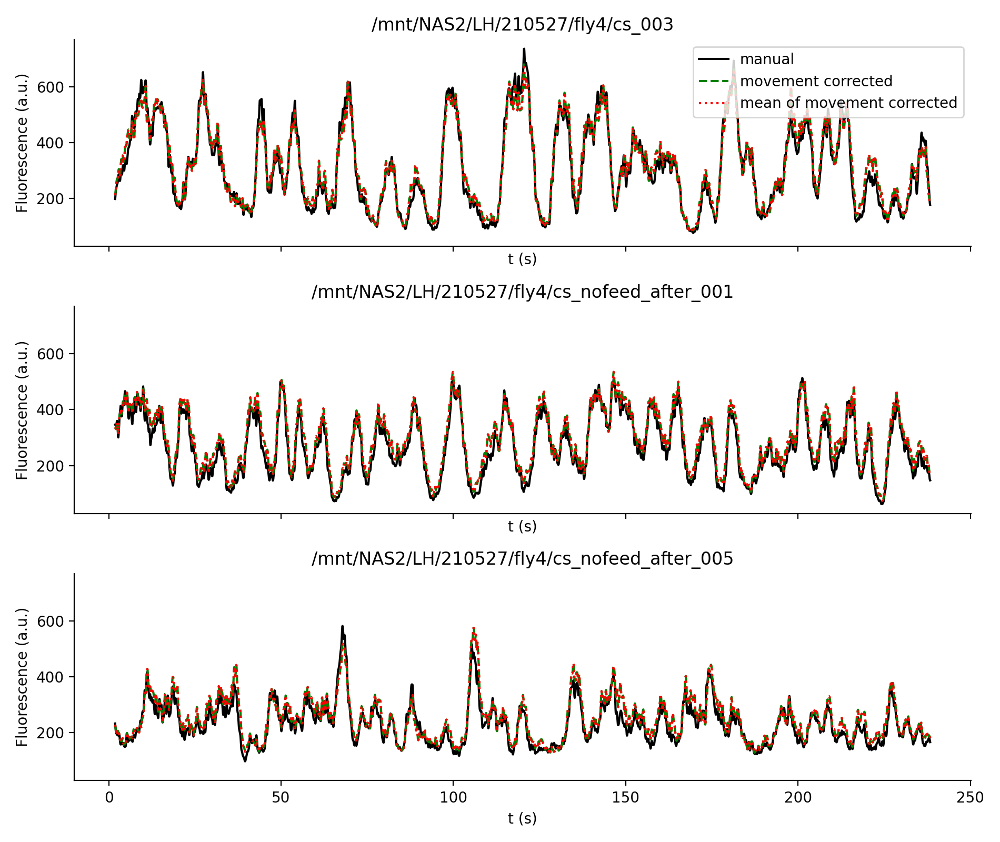

In [105]:
%matplotlib notebook

this_i_trials = [0,2,3]
i_neuron = 13  # 7

def this_filter(signal, sigma=2):
    return gaussian_filter1d(signal, sigma=sigma, axis=0)

fig, axs = plt.subplots(len(this_i_trials),1, figsize=(9.5,8), sharex=True, sharey=True)
for (i_trial, ax) in zip(this_i_trials, axs):
    ax.plot(neural_dfs_matched[i_trial]["t"],this_filter(neural_dfs_matched[i_trial].filter(regex="neuron").iloc[:,i_neuron].values), 
            "k", label="manual")
    ax.plot(neural_dfs_matched[i_trial]["t"],this_filter(neural_dfs_corrected[i_trial].filter(regex="neuron").iloc[:,i_neuron].values), 
            "g--", label="movement corrected")
    ax.plot(neural_dfs_matched[i_trial]["t"],this_filter(neural_dfs_corrected_mean[i_trial].filter(regex="neuron").iloc[:,i_neuron].values), 
            "r:", label="mean of movement corrected")
    ax.set_xlabel("t (s)")
    ax.set_ylabel("Fluorescence (a.u.)")
    ax.set_title(selected_trial_dirs[i_trial])
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    if i_trial == 0:
        ax.legend()
fig.tight_layout()

In [106]:
# fly_dir
all_i_trials = [3,6,10]
condition = "27.05. no feed"
compare_i_trials = [3,6,10]
thres_rest = 0.015
thres_walk = 0.03
trial_names = ["before 4",
               "right after 2", 
               "long after 1"]

In [107]:
pcan_manual = an.InterPCAAnalysis(fly_dir=fly_dir, 
                                 i_trials=all_i_trials, 
                                 condition=condition + " manual ROIs", 
                                 compare_i_trials=compare_i_trials, 
                                 thres_walk=thres_walk, 
                                 thres_rest=thres_rest,
                                 load_df=True, 
                                 load_pixels=False, 
                                 pixel_shape=None, 
                                 sigma=1, # 0  # 1  # 3 
                                 trial_names=trial_names,
                                 twop_df_name="twop_df.pkl")

Read the centers of 78 ROIs from file


In [108]:
pcan_corrected = an.InterPCAAnalysis(fly_dir=fly_dir, 
                                 i_trials=all_i_trials, 
                                 condition=condition + " corrected ROIs", 
                                 compare_i_trials=compare_i_trials, 
                                 thres_walk=thres_walk, 
                                 thres_rest=thres_rest,
                                 load_df=True, 
                                 load_pixels=False, 
                                 pixel_shape=None, 
                                 sigma=1, # 0  # 1  # 3 
                                 trial_names=trial_names,
                                 twop_df_name="twop_df_corrected.pkl")

Read the centers of 78 ROIs from file


In [109]:
pcan_corrected_mean = an.InterPCAAnalysis(fly_dir=fly_dir, 
                                 i_trials=all_i_trials, 
                                 condition=condition + " mean corrected ROIs", 
                                 compare_i_trials=compare_i_trials, 
                                 thres_walk=thres_walk, 
                                 thres_rest=thres_rest,
                                 load_df=True, 
                                 load_pixels=False, 
                                 pixel_shape=None, 
                                 sigma=1, # 0  # 1  # 3 
                                 trial_names=trial_names,
                                 twop_df_name="twop_df_corrected_mean.pkl")

Read the centers of 78 ROIs from file


In [110]:
pcans = [pcan_manual, pcan_corrected, pcan_corrected_mean]

In [111]:
for pcan in pcans:
    pcan.sort_neurons()
    w = pcan.get_w_inter_pca_walk_rest_neurons()
    pcan.get_covs_walk_rest_neurons()
    pcan.get_covs_inter_trial_neurons()
    pcan.get_inter_pca_trials_neurons()
    pcan.get_inter_condition_variance_ratios_neurons()

<IPython.core.display.Javascript object>


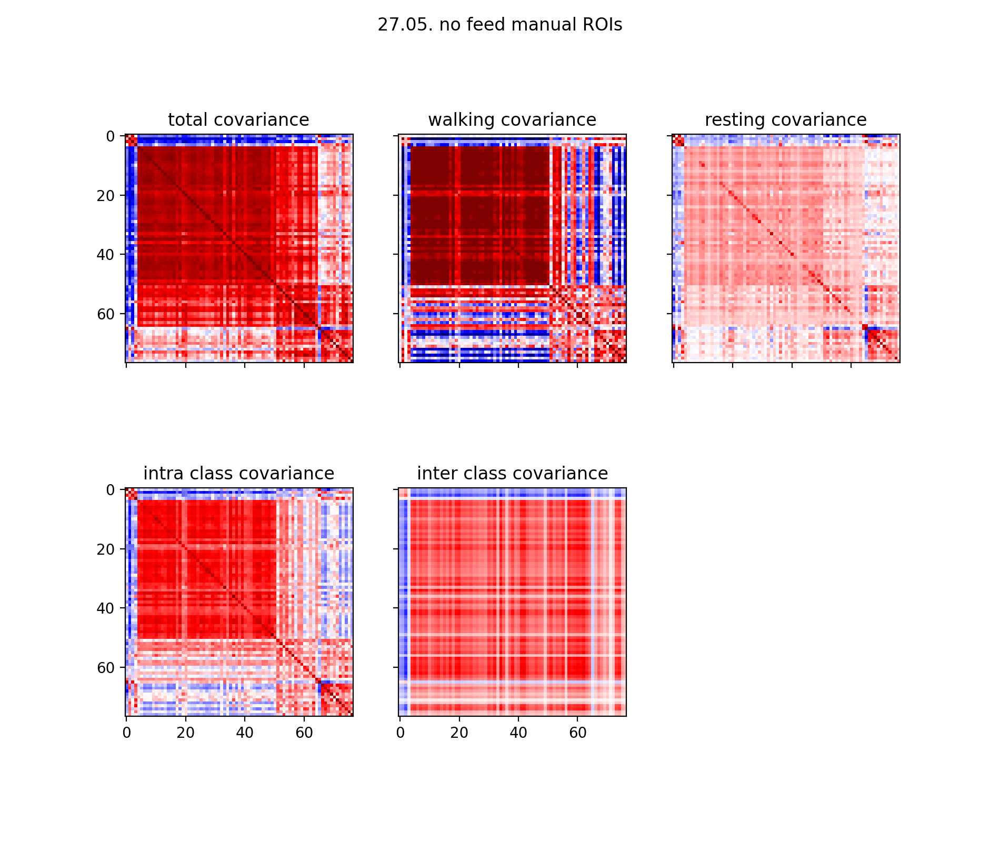

<IPython.core.display.Javascript object>


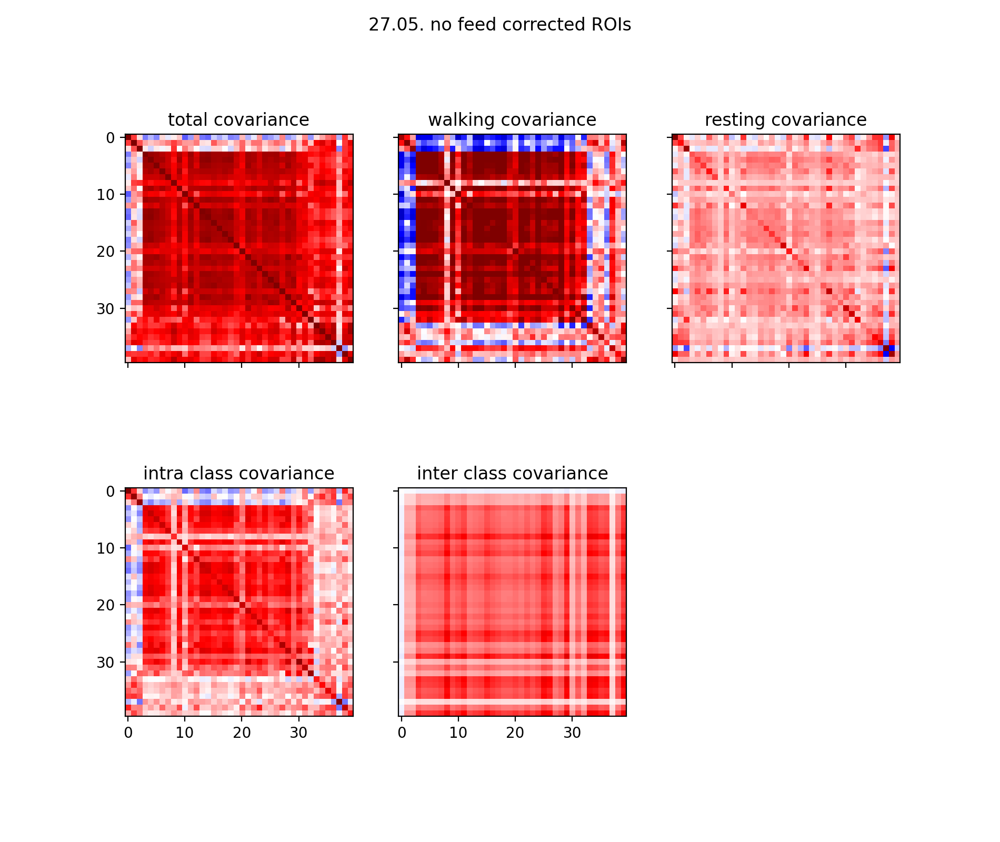

<IPython.core.display.Javascript object>


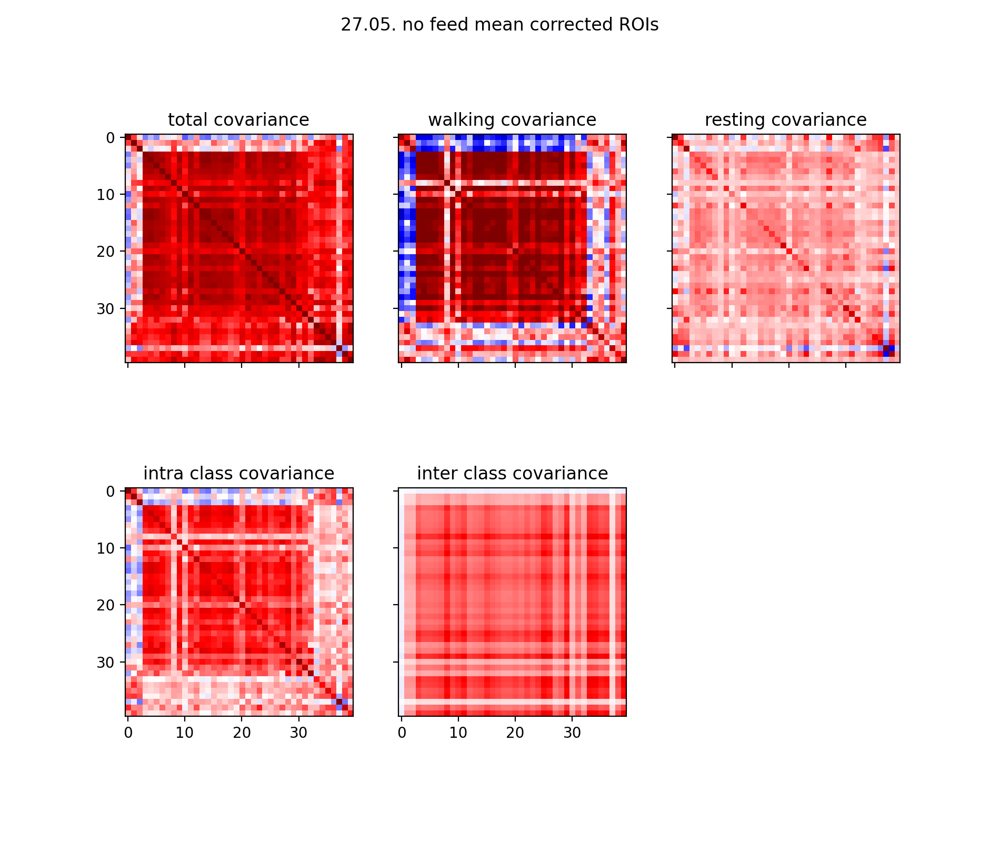

In [112]:
%matplotlib notebook

for pcan in pcans:
    fig, axs = plt.subplots(2,3,figsize=(9.5, 8), sharex=True, sharey=True)
    clim = [np.quantile(pcan.cov_neurons, 0.01), np.quantile(pcan.cov_neurons, 0.99)]
    clim = [-1,1]
    axs[0,0].imshow(pcan.cov_neurons, clim=clim, cmap=plt.cm.get_cmap("seismic"))
    axs[0,0].set_title("total covariance")
    axs[0,1].imshow(pcan.cov_neurons_walk, clim=clim, cmap=plt.cm.get_cmap("seismic"))
    axs[0,1].set_title("walking covariance")
    axs[0,2].imshow(pcan.cov_neurons_rest, clim=clim, cmap=plt.cm.get_cmap("seismic"))
    axs[0,2].set_title("resting covariance")
    axs[1,0].imshow(pcan.cov_neurons_rest_walk_intra, clim=clim, cmap=plt.cm.get_cmap("seismic"))
    axs[1,0].set_title("intra class covariance")
    axs[1,1].imshow(pcan.cov_neurons_rest_walk_inter, clim=clim, cmap=plt.cm.get_cmap("seismic"))
    axs[1,1].set_title("inter class covariance")
    axs[1,2].axis("off")
    fig.suptitle(pcan.condition)

<IPython.core.display.Javascript object>


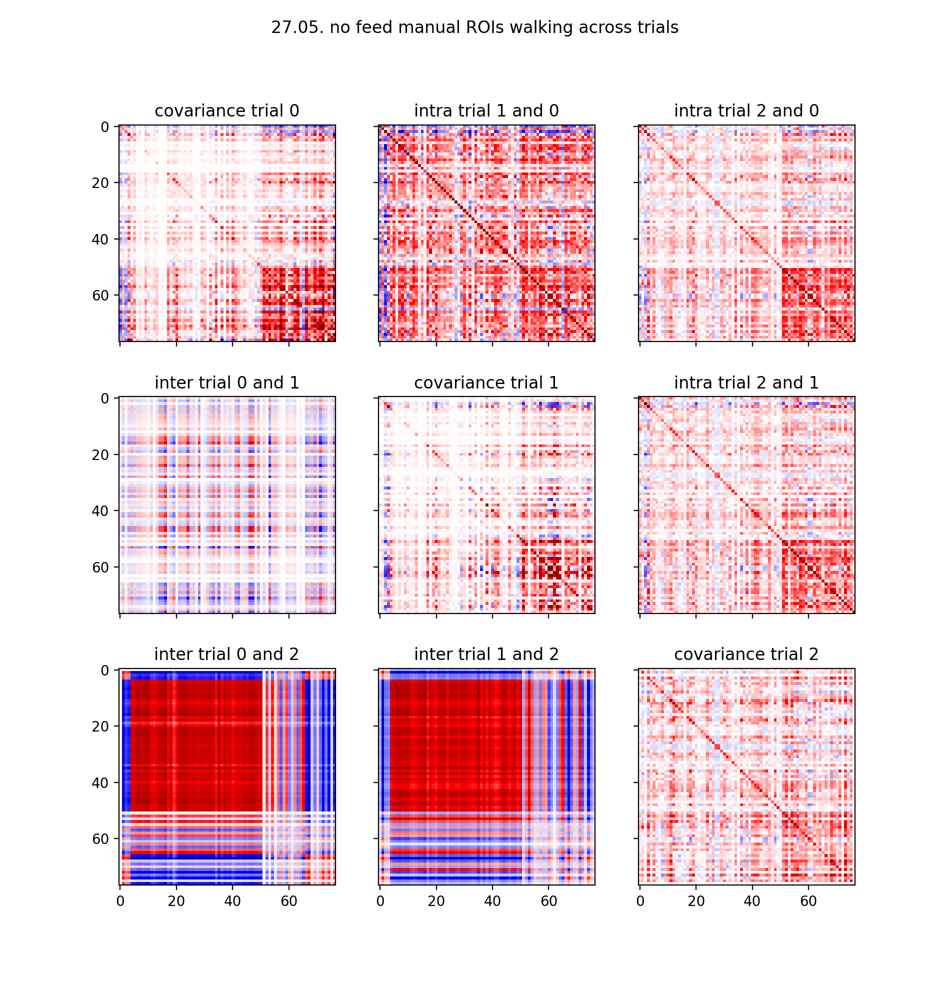

<IPython.core.display.Javascript object>


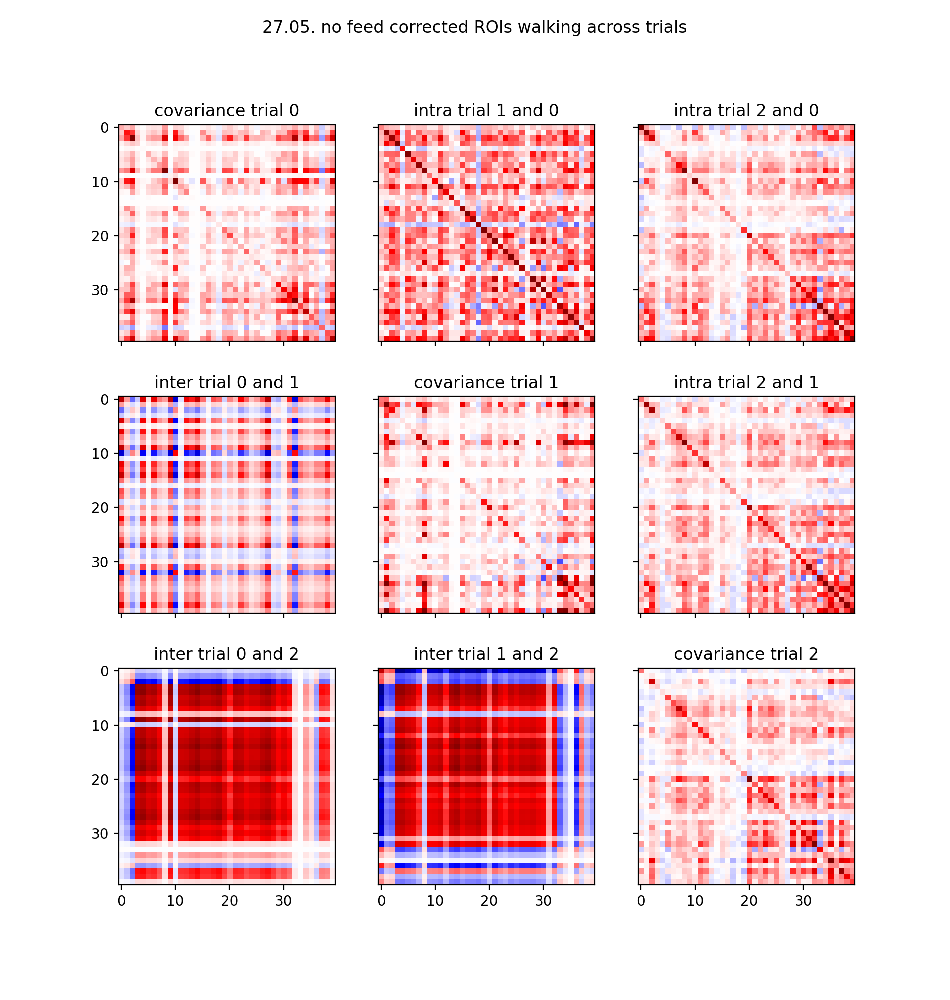

<IPython.core.display.Javascript object>


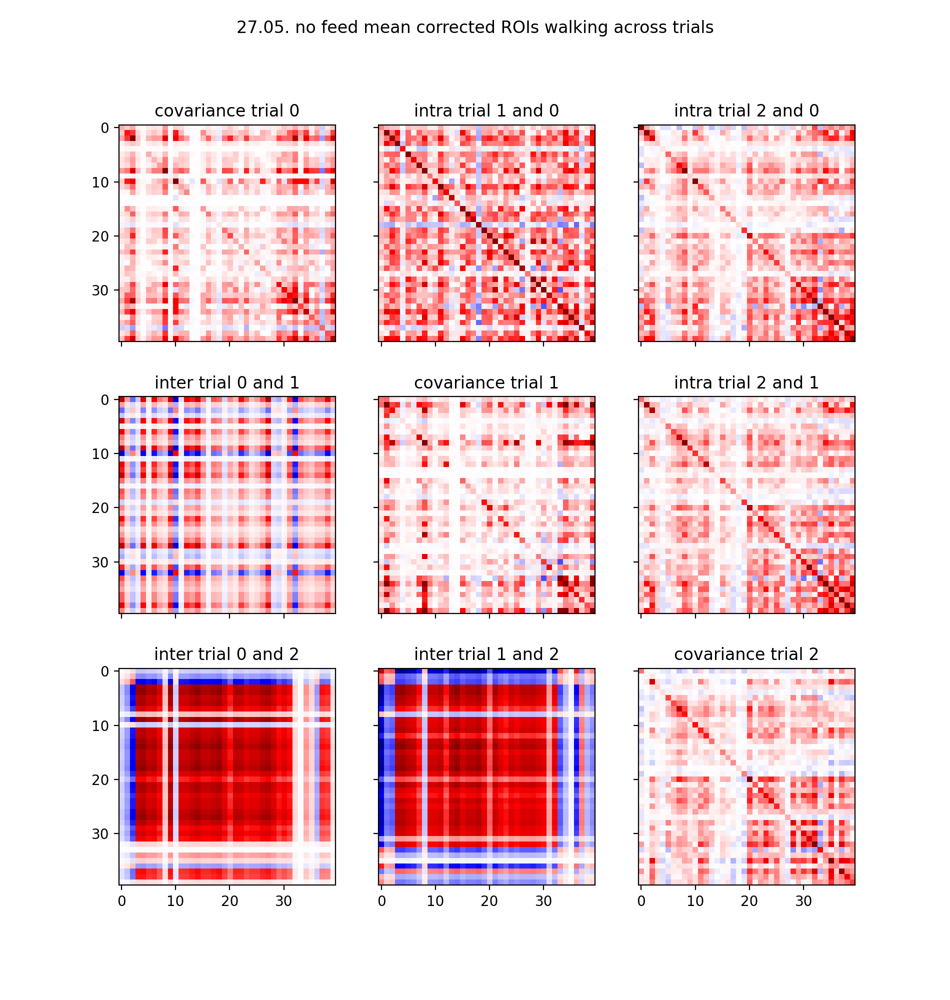

In [113]:
%matplotlib notebook
for pcan in pcans:
    an.plot_cov_matrix(pcan.cov_neurons_matrix_walk, trials=[0,1,2], clim=[-1,1], name=pcan.condition+" walking across trials")

<IPython.core.display.Javascript object>


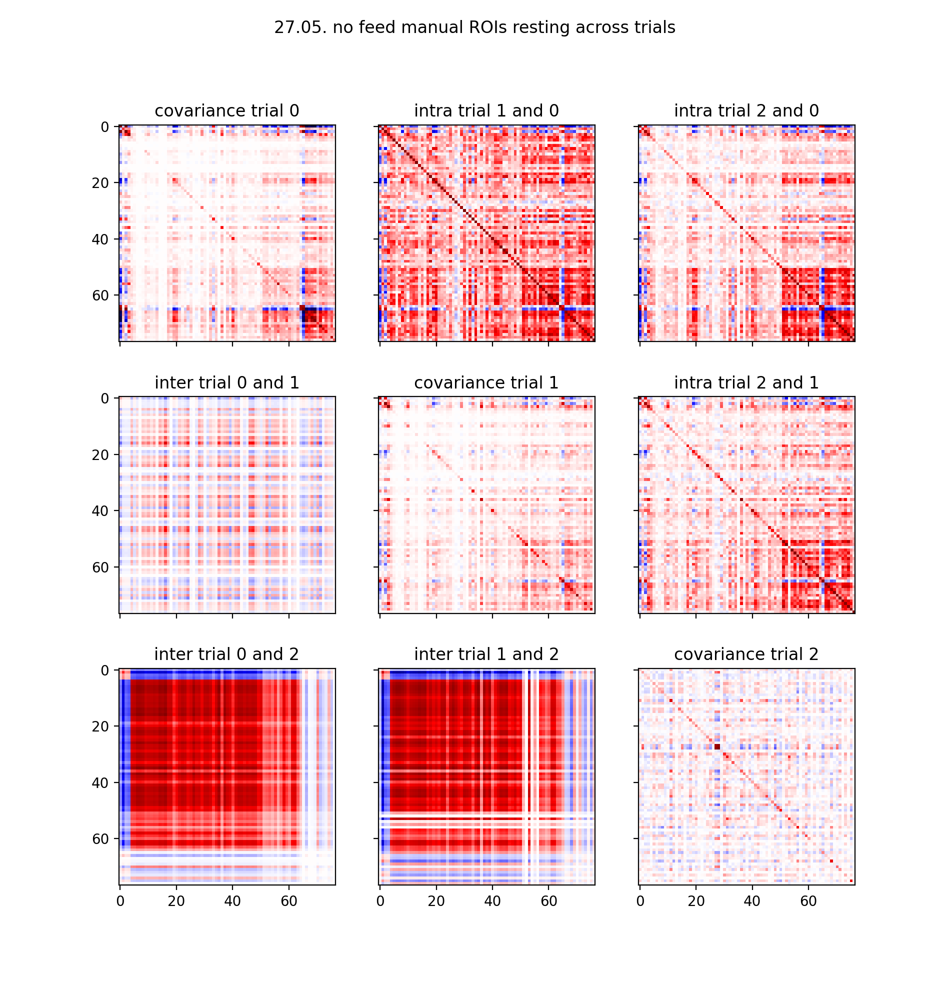

<IPython.core.display.Javascript object>


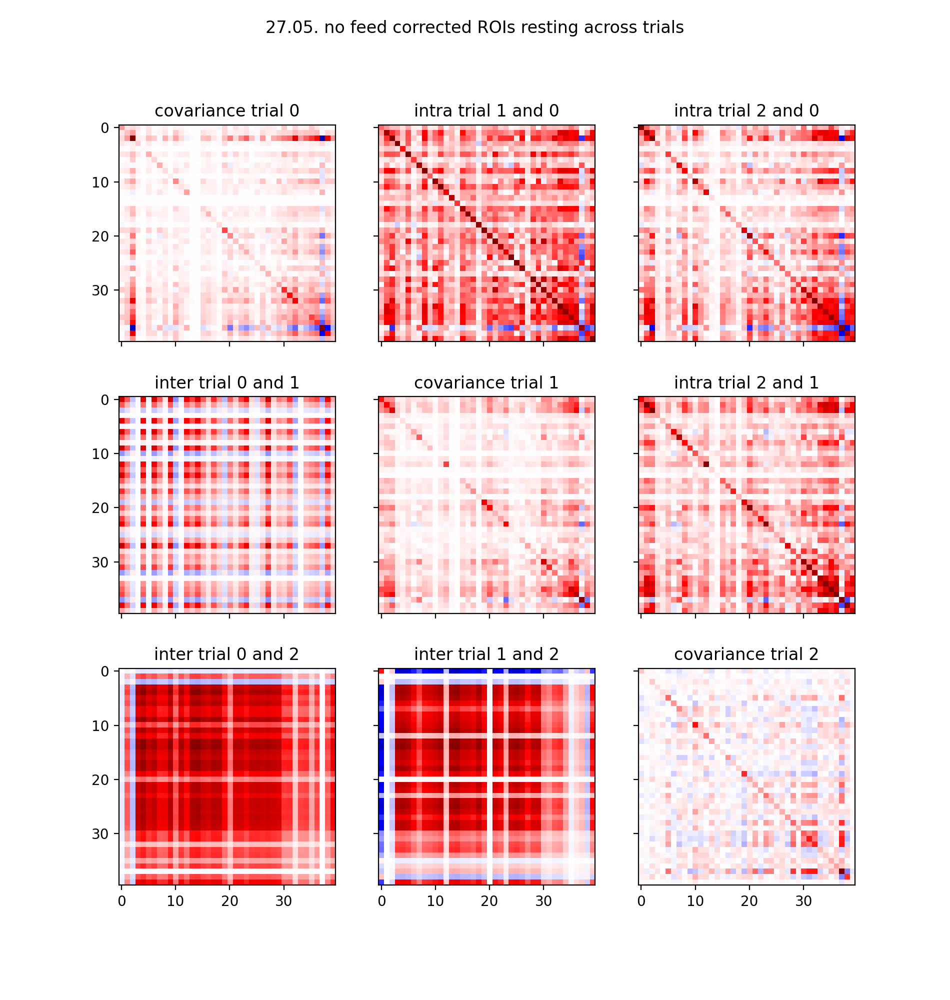

<IPython.core.display.Javascript object>


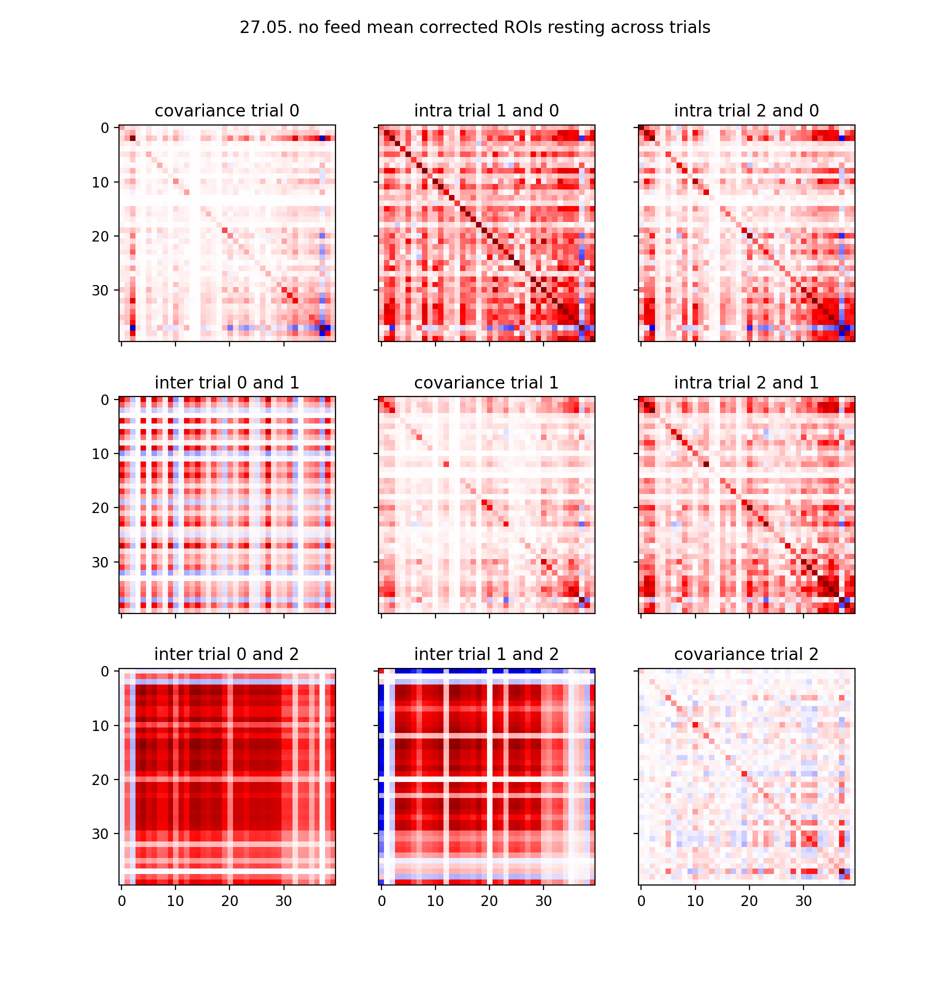

In [114]:
%matplotlib notebook
for pcan in pcans:
    an.plot_cov_matrix(pcan.cov_neurons_matrix_rest, trials=[0,1,2], clim=[-1,1], name=pcan.condition+" resting across trials")

<IPython.core.display.Javascript object>


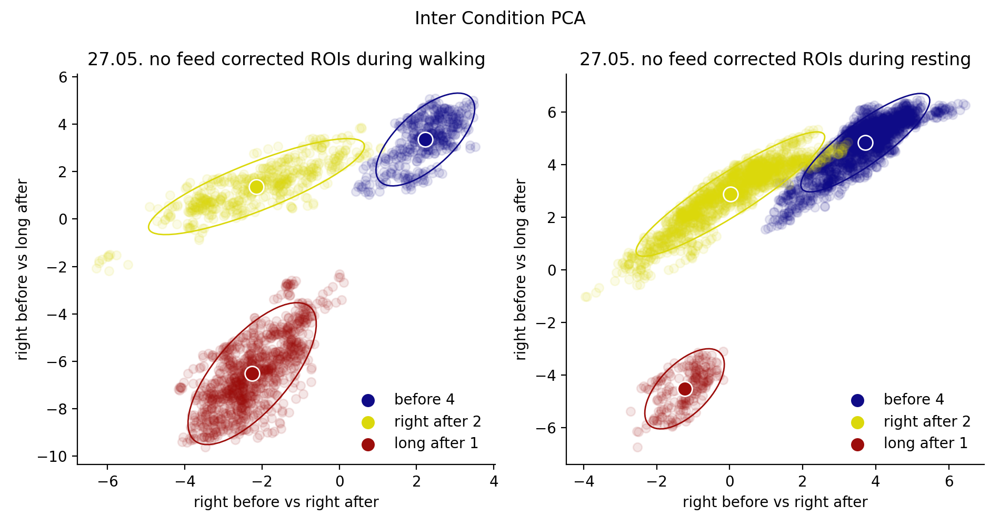

In [116]:
%matplotlib notebook

# colors_long = [myplt.BLACK, myplt.DARKBLUE, myplt.DARKGREEN, myplt.DARKYELLOW, myplt.DARKORANGE, myplt.DARKRED]
# colors_contrast_long = [myplt.DARKGRAY, myplt.DARKBLUE_CONTRAST, myplt.DARKGREEN_CONTRAST, myplt.DARKPINK, myplt.DARKPURPLE, myplt.DARKBROWN]
colors_long = [myplt.DARKBLUE,  # myplt.DARKBLUE_CONTRAST, myplt.DARKGREEN, # myplt.DARKGREEN_CONTRAST, 
          myplt.DARKYELLOW,myplt.DARKRED]
colors_contrast_long = colors_long
# colors = [myplt.DARKBLUE, myplt.DARKYELLOW, myplt.DARKRED]
# colors_contrast = [myplt.DARKBLUE_CONTRAST,myplt.DARKPINK, myplt.DARKBROWN]
# order = [0,4,1,5,2,3]

fig, axs = plt.subplots(1,2, figsize=(9.5,5))  # , sharex="col", sharey="col")
    
i_fly = 1
pcan = pcans[i_fly]

long_bef = 0
short_bef = 0
right_aft = 1
long_aft = 2
"""
an.plot_proj_scatter(w_1=pcan.w_inter_pca_walk_neurons[short_bef,right_aft], w_2=pcan.w_inter_pca_walk_neurons[long_bef,short_bef],
             X_trials=pcan.neurons_walk, trials=[0,1,2], w_names=["right before vs right after", "long before vs right after"],
             X_names=pcan.trial_names, 
             fig=fig, ax=axs[0,0], alpha=0.1, name=pcan.condition+" during walking",colors=colors_long)
an.plot_proj_scatter(w_1=pcan.w_inter_pca_rest_neurons[short_bef,right_aft], w_2=pcan.w_inter_pca_rest_neurons[long_bef,short_bef],
             X_trials=pcan.neurons_rest, trials=[0,1,2], w_names=["right before vs right after", "long before vs right after"],
             X_names=pcan.trial_names, 
             fig=fig, ax=axs[0,1], alpha=0.1, name=pcan.condition+" during resting",colors=colors_contrast_long)
"""
an.plot_proj_scatter(w_1=pcan.w_inter_pca_walk_neurons[short_bef,right_aft], w_2=pcan.w_inter_pca_walk_neurons[short_bef,long_aft],
             X_trials=pcan.neurons_walk, trials=[0,1,2], w_names=["right before vs right after", "right before vs long after"],
             X_names=pcan.trial_names, 
             fig=fig, ax=axs[0], alpha=0.1, name=pcan.condition+" during walking",colors=colors_long)
an.plot_proj_scatter(w_1=pcan.w_inter_pca_rest_neurons[short_bef,right_aft], w_2=pcan.w_inter_pca_rest_neurons[short_bef,long_aft],
             X_trials=pcan.neurons_rest, trials=[0,1,2], w_names=["right before vs right after", "right before vs long after"],
             X_names=pcan.trial_names, 
             fig=fig, ax=axs[1], alpha=0.1, name=pcan.condition+" during resting",colors=colors_contrast_long)

fig.suptitle("Inter Condition PCA")
fig.tight_layout()